In [1]:
#libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
from nltk.corpus import stopwords
from nltk import text
import textblob
from textblob import TextBlob
from nltk.stem import PorterStemmer,WordNetLemmatizer
from nltk.tokenize import RegexpTokenizer
from nltk import word_tokenize
import plotly
from plotly import offline
import os
import re
import time
import pandas as pd
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity 
from plotly.offline import iplot
import cufflinks
from sklearn.metrics.pairwise import cosine_similarity 
import re
import string
stop=stopwords.words('English')
import wordcloud
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
import numpy as np
%matplotlib inline
offline.init_notebook_mode(connected=True)
import warnings
warnings.filterwarnings('ignore')
stem=PorterStemmer()

In [2]:
import os

In [3]:
names=[]

In [4]:
mypath='C:\\Users\\huzaifamawahab\\Desktop\\Courses\\Data Science Projects\\!Data_Science_Bahria_project\\ShortStories\\'
from os import listdir
from os.path import isfile, join
onlyfiles = [f for f in listdir(mypath) if isfile(join(mypath, f))]
files_obj=[0 for i in range(50)]

In [5]:
for i in range(50):
    with open(mypath+str(i+1)+".txt",mode='r',encoding='utf-8') as file:
        files_obj[i]=file.read()
        file.close()

In [6]:
contractions = {
"ain't": "am not",
"aren't": "are not",
"can't": "cannot",
"can't've": "cannot have",
"'cause": "because",
"could've": "could have",
"couldn't": "could not",
"couldn't've": "could not have",
"didn't": "did not",
"doesn't": "does not",
"don't": "do not",
"hadn't": "had not",
"hadn't've": "had not have",
"hasn't": "has not",
"haven't": "have not",
"he'd": "he would",
"he'd've": "he would have",
"he'll": "he will",
"he'll've": "he will have",
"he's": "he is",
"how'd": "how did",
"how'd'y": "how do you",
"how'll": "how will",
"how's": "how does",
"i'd": "i would",
"i'd've": "i would have",
"i'll": "i will",
"i'll've": "i will have",
"i'm": "i am",
"i've": "i have",
"isn't": "is not",
"it'd": "it would",
"it'd've": "it would have",
"it'll": "it will",
"it'll've": "it will have",
"it's": "it is",
"let's": "let us",
"ma'am": "madam",
"mayn't": "may not",
"might've": "might have",
"mightn't": "might not",
"mightn't've": "might not have",
"must've": "must have",
"mustn't": "must not",
"mustn't've": "must not have",
"needn't": "need not",
"needn't've": "need not have",
"o'clock": "of the clock",
"oughtn't": "ought not",
"oughtn't've": "ought not have",
"shan't": "shall not",
"sha'n't": "shall not",
"shan't've": "shall not have",
"she'd": "she would",
"she'd've": "she would have",
"she'll": "she will",
"she'll've": "she will have",
"she's": "she is",
"should've": "should have",
"shouldn't": "should not",
"shouldn't've": "should not have",
"so've": "so have",
"so's": "so is",
"that'd": "that would",
"that'd've": "that would have",
"that's": "that is",
"there'd": "there would",
"there'd've": "there would have",
"there's": "there is",
"they'd": "they would",
"they'd've": "they would have",
"they'll": "they will",
"they'll've": "they will have",
"they're": "they are",
"they've": "they have",
"to've": "to have",
"wasn't": "was not",
"u": "you",
"ur ": "your",
"n": "and"}

In [7]:
def prep(text):
    text=text.lower()
    text=re.sub('[\\n\\t]','',text)
    text=re.sub('https*\S+','',text)
    text=re.sub('@\S+','',text)
    rem=str(re.escape(string.punctuation))
    text=re.sub('['+rem+']','',text)
    text=[word for word in text.split(' ') if word not in stop]
    for index,value in enumerate(text):
        for key in contractions.keys():
            if(value == key):
                text[index] = contractions[key]
    text=' '.join(text)
    return text

In [8]:
prep_file=files_obj.copy()

In [9]:
for index,file in enumerate(files_obj):
    prep_file[index]=prep(file)

In [42]:
def wordcloud(text,t):
    alice_mask = np.array(Image.open("abcd.jpeg"))
    wc= WordCloud(background_color="white",max_words=4000,mask=alice_mask)
    wc.generate(text)
    plt.figure(figsize=(25,25))
    plt.subplot(221)
    plt.axis("off")
    plt.title("Words frequented in Document: "+t, fontsize=20)
    plt.imshow(wc.recolor(colormap= 'gist_earth' , random_state=244), alpha=0.98)
    plt.axis('off')
    plt.savefig(t+".png")
    plt.show()

In [12]:

def top_words(text, i):
    vec = CountVectorizer()
    vec.fit(text)
    bow = vec.transform(text)
    wordsum = bow.sum(axis=0)
    words_frequencies = [(words, wordsum[0,index])for words, index in vec.vocabulary_.items()] 
    words_frequencies = sorted(words_frequencies, key=lambda x:x[1], reverse=True)
    return words_frequencies[:i]

In [13]:
top_word=top_words(prep_file, 10)

In [14]:
text = pd.DataFrame(top_word,columns=['Word','Freq'])

In [15]:
text['Word']=text['Word'].str.upper()

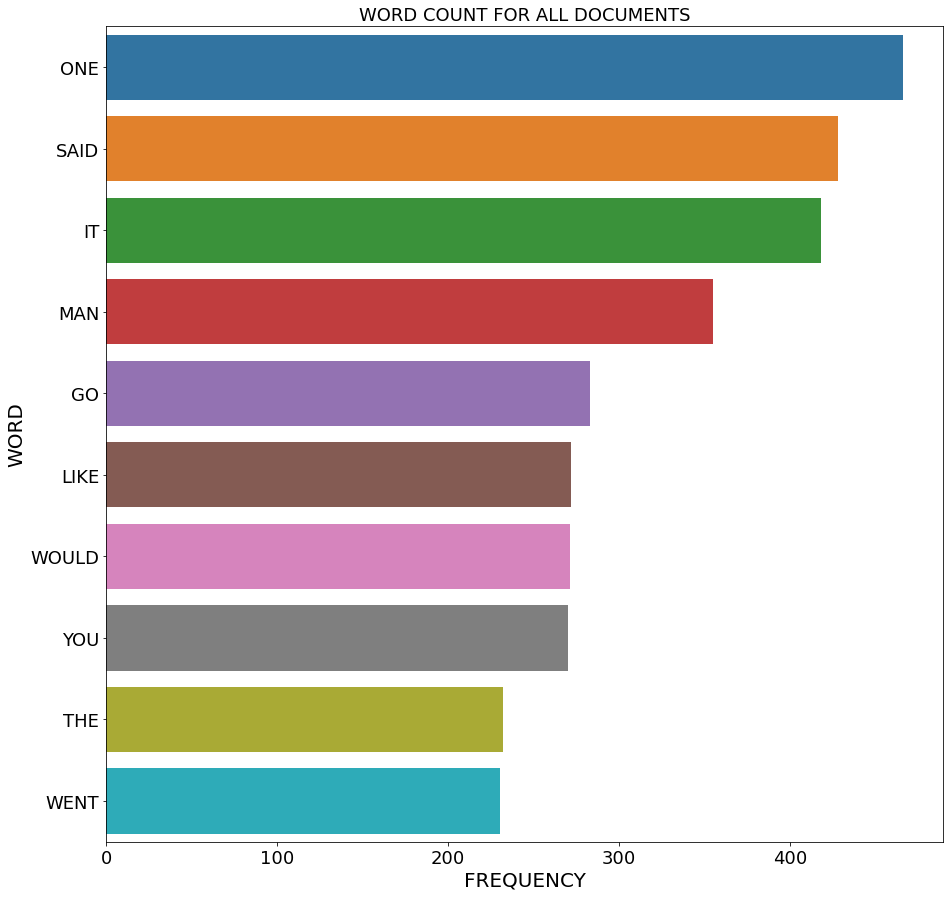

In [16]:
plt.figure(figsize=(15,15))
plt.title("WORD COUNT FOR ALL DOCUMENTS",fontsize=18)
sns.barplot(y=text['Word'],x=text['Freq'])
plt.ylabel('WORD',fontsize=20)
plt.xlabel('FREQUENCY',fontsize=20)
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)
plt.show()

In [17]:
def top_words(text, i):
    vec = CountVectorizer(ngram_range=(2,2))
    vec.fit(text)
    bow = vec.transform(text)
    wordsum = bow.sum(axis=0)
    words_frequencies = [(words, wordsum[0,index])for words, index in vec.vocabulary_.items()] 
    words_frequencies = sorted(words_frequencies, key=lambda x:x[1], reverse=True)
    return words_frequencies[:i]

In [18]:
top_words(prep_file, 20)

[('andrey yefimitch', 104),
 ('ivan dmitritch', 53),
 ('old man', 49),
 ('young man', 38),
 ('mihail averyanitch', 34),
 ('let us', 28),
 ('go away', 25),
 ('don know', 25),
 ('dear fellow', 22),
 ('long time', 20),
 ('let go', 18),
 ('nina ivanovna', 18),
 ('don understand', 17),
 ('far away', 17),
 ('examining magistrate', 17),
 ('said andrey', 16),
 ('pavel vassilyevitch', 16),
 ('old woman', 15),
 ('one would', 15),
 ('yes yes', 15)]

In [19]:
def top_words(text, i):
    vec = CountVectorizer(ngram_range=(3,3))
    vec.fit(text)
    bow = vec.transform(text)
    wordsum = bow.sum(axis=0)
    words_frequencies = [(words, wordsum[0,index])for words, index in vec.vocabulary_.items()] 
    words_frequencies = sorted(words_frequencies, key=lambda x:x[1], reverse=True)
    return words_frequencies[:i]

In [20]:
top_words(prep_file, 20)

[('said andrey yefimitch', 13),
 ('let us go', 13),
 ('the examining magistrate', 8),
 ('andrey yefimitch would', 7),
 ('said ivan dmitritch', 7),
 ('says young man', 6),
 ('mihail averyanitch would', 5),
 ('first time life', 5),
 ('far far away', 5),
 ('the young man', 5),
 ('half hour later', 5),
 ('mother nina ivanovna', 5),
 ('twenty years ago', 4),
 ('mercy upon us', 4),
 ('five hundred roubles', 4),
 ('my dear fellow', 4),
 ('well thank god', 4),
 ('variegated young ladies', 4),
 ('little old man', 4),
 ('says marya petrovna', 4)]

In [21]:
pp = TextBlob(str(prep_file[0]))

In [22]:
pp

TextBlob("horsestealersa hospital assistant called yergunov emptyheaded fellow knownthroughout district great braggart drunkard returningone evening christmas week hamlet ryepino hadbeen make purchases hospital might get home ingood time late doctor lent best horseat first still day eight o’clock violent snowstorm came four miles home yergunovcompletely lost wayhe know drive know road drove onat random hoping horse would find way two hourspassed horse exhausted chilled alreadybegan fancy going home back towards ryepino butat last uproar storm heard faraway barking adog murky red blur came sight ahead little bylittle outlines high gate could discerned longfence nails points uppermost beyondthe fence stood slanting crane well wind drove awaythe mist snow eyes redblur sprang small squat little house steep thatchedroof three little windows one covered inside withsomething red lighted upwhat sort place yergunov remembered right theroad three half four miles hospital andreytchirikov’s tavern

In [23]:
df = pd.DataFrame(pp.pos_tags, columns=['words', 'pos'])

In [24]:
df_words = df['pos'].value_counts()

<AxesSubplot:>

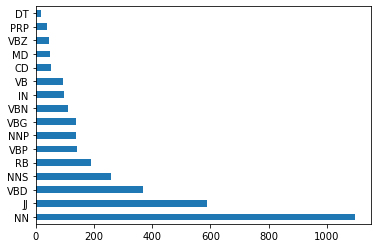

In [25]:
df_words.loc["NN":"DT"].plot(kind='barh')

In [26]:
def getPolarity(text):
    r=TextBlob(text).sentiment.polarity
    if(r<0):
        return "Negative"
    elif(r==0):
        return "Neutral"
    else:
        return "Positive"
def avg_word_len(text):
    a=text.split(" ")
    sums=0
    for i in a:
        sums=sums+len(i)
    return sums/len(a)

In [27]:
polarity=[]
for l in prep_file:
    polarity.append(getPolarity(l))
word_count=[]
for k in prep_file:
    word_count.append(len(k))
avg_word=[]
for j in prep_file:
    avg_word.append(avg_word_len(j))

In [28]:
## ISKO KARNA HAY
data={"names":onlyfiles,"polarity":polarity,'WordCount':word_count,'AVG WORD COUNT: ': avg_word}
df_Data=pd.DataFrame(data)
df_Data

,names,polarity,WordCount,AVG WORD COUNT:
0,1.txt,Positive,22626,6.126614
1,10.txt,Positive,80022,6.676067
2,11.txt,Positive,14510,6.173010
3,12.txt,Positive,6209,5.495816
4,13.txt,Positive,5542,5.998737
5,14.txt,Negative,5958,5.994131
6,15.txt,Positive,7236,5.627289
7,16.txt,Negative,12162,6.087995
8,17.txt,Positive,5818,6.264669
9,18.txt,Negative,9118,6.643755


In [29]:
tiles=[]
body=[]

for index, value in enumerate(files_obj):
    tiles.append(files_obj[index].split('\n')[0].strip())
    files_obj[index]=files_obj[index].replace(files_obj[index].split('\n')[0],"")

In [30]:
wordnet = WordNetLemmatizer()
new_lem_file=[]
for i in range(50):
    new_lem_file.append(wordnet.lemmatize(prep_file[i]))

In [48]:
def create_tfidf_features(corpus, max_features=100000, max_df=0.95, min_df=2):
    
    tfidf_vectorizor = TfidfVectorizer(decode_error='replace', strip_accents='unicode', analyzer='word',
                                       ngram_range=(1, 1), max_features=max_features,
                                       norm='l2', use_idf=True, smooth_idf=True, sublinear_tf=True,
                                       max_df=max_df, min_df=min_df)
    X = tfidf_vectorizor.fit_transform(corpus)
    return X, tfidf_vectorizor




def calculate_similarity(X, vectorizor, query, top_k=5):

    
    
    query_vec = vectorizor.transform(query)
    
    cosine_similarities = cosine_similarity(X,query_vec).flatten()
    
    most_similar_doc_indices = np.argsort(cosine_similarities, axis=0)[:-top_k-1:-1]
    return (most_similar_doc_indices, cosine_similarities)
def show_similar_documents(df, cosine_similarities, similar_doc_indices):
    
    counter = 1
    for index in similar_doc_indices:
        print('Top-{}, Similarity = {}'.format(counter, cosine_similarities[index]))
        print('Document: {}, .txt'.format(index + 1))
        counter += 1

In [49]:
X,v = create_tfidf_features(prep_file)

In [50]:
features = v.get_feature_names()
len(features)

4725

In [51]:
import string
user_question = ['IN THE DARK']
sim_vecs, cosine_similarities = calculate_similarity(X, v, user_question,top_k=20)
show_similar_documents(prep_file, cosine_similarities, sim_vecs)

Top-1, Similarity = 0.0693993521222621
Document: 14, .txt
Top-2, Similarity = 0.06429380313576924
Document: 27, .txt
Top-3, Similarity = 0.05683232675349215
Document: 43, .txt
Top-4, Similarity = 0.05441271049520103
Document: 23, .txt
Top-5, Similarity = 0.0500035889911047
Document: 6, .txt
Top-6, Similarity = 0.04207378101890121
Document: 33, .txt
Top-7, Similarity = 0.04182173955258842
Document: 31, .txt
Top-8, Similarity = 0.041670418841149706
Document: 46, .txt
Top-9, Similarity = 0.04067375098689543
Document: 1, .txt
Top-10, Similarity = 0.03822671021496917
Document: 11, .txt
Top-11, Similarity = 0.034212376132457124
Document: 19, .txt
Top-12, Similarity = 0.033988420981267455
Document: 39, .txt
Top-13, Similarity = 0.03333651424801831
Document: 16, .txt
Top-14, Similarity = 0.030213017221119548
Document: 21, .txt
Top-15, Similarity = 0.02888337662020922
Document: 34, .txt
Top-16, Similarity = 0.02824562455791248
Document: 4, .txt
Top-17, Similarity = 0.027643036513776826
Document

In [35]:
import pickle
dbfile = open('X.pkl', 'ab')
pickle.dump(X, dbfile)                     
dbfile.close()

In [36]:
import pickle
dbfile = open('V.pkl', 'ab')
pickle.dump(v, dbfile)                     
dbfile.close()

In [37]:
import pickle
dbfile = open('FILE.pkl', 'ab')
pickle.dump(new_lem_file, dbfile)                     
dbfile.close()

In [38]:
import pickle
dbfile = open('TITLE.pkl', 'ab')
pickle.dump(tiles, dbfile)                     
dbfile.close()

In [39]:
import pickle
dbfile = open('Orig.pkl', 'ab')
pickle.dump(files_obj, dbfile)                     
dbfile.close()

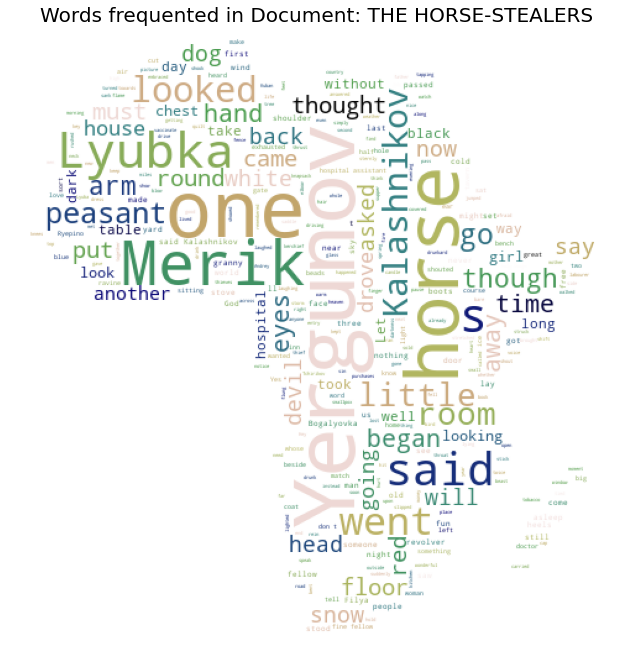

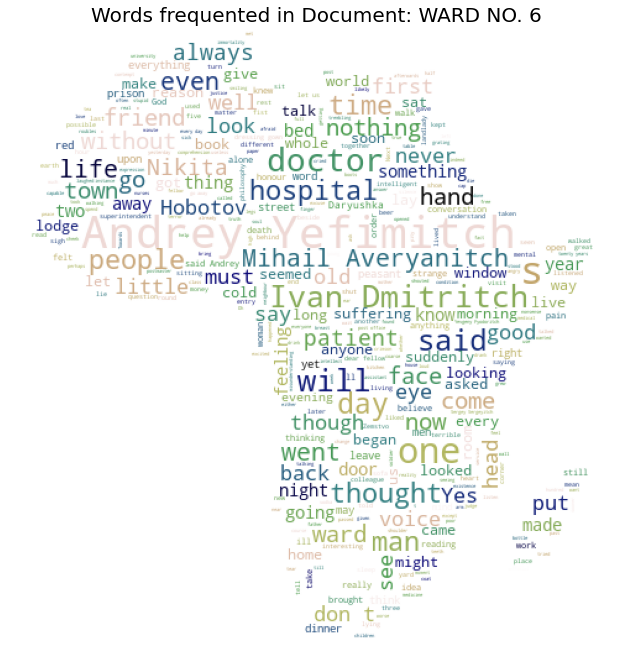

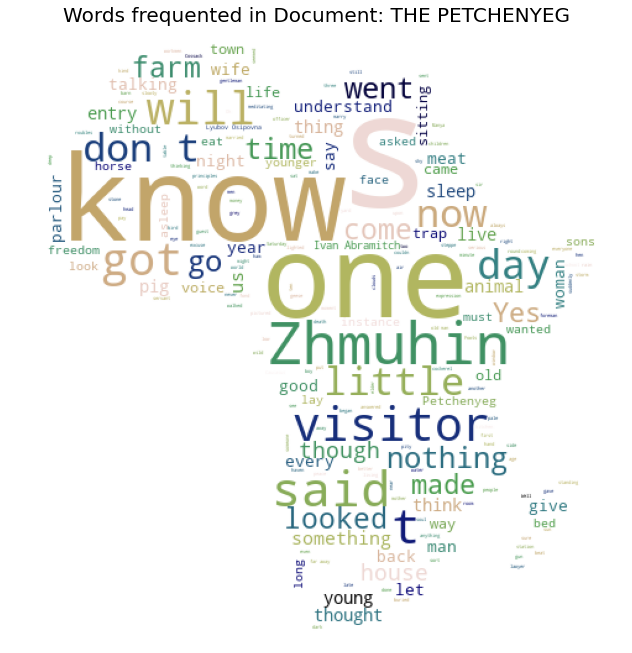

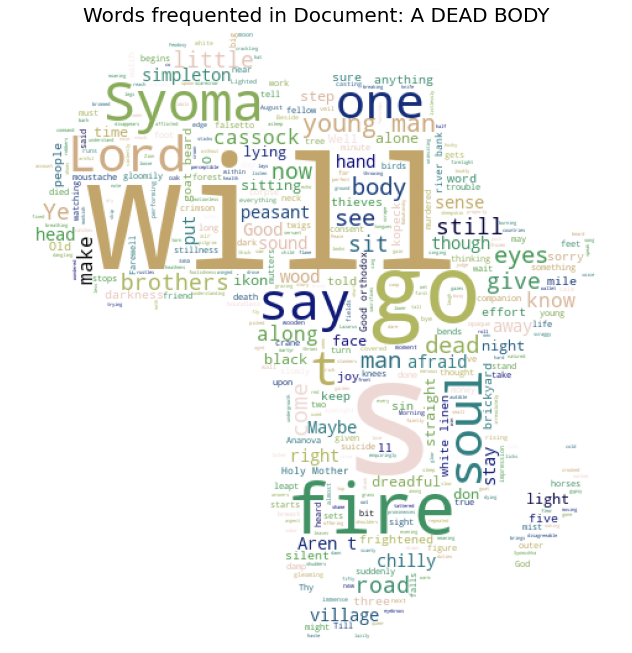

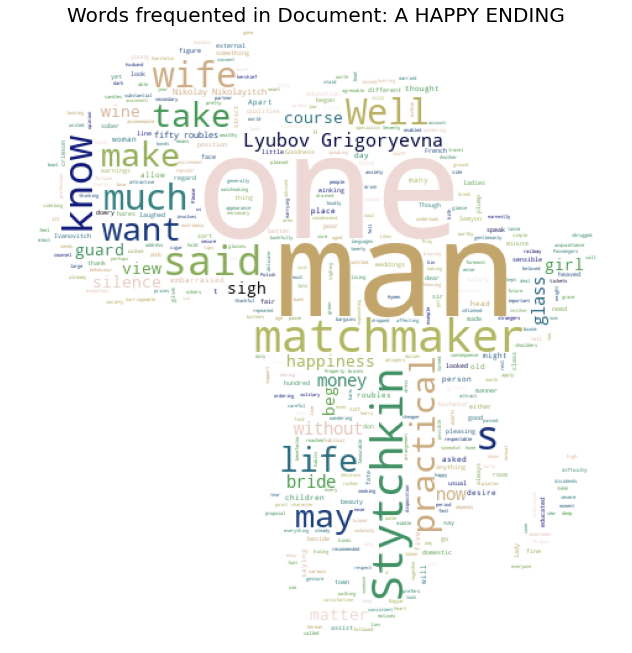

...

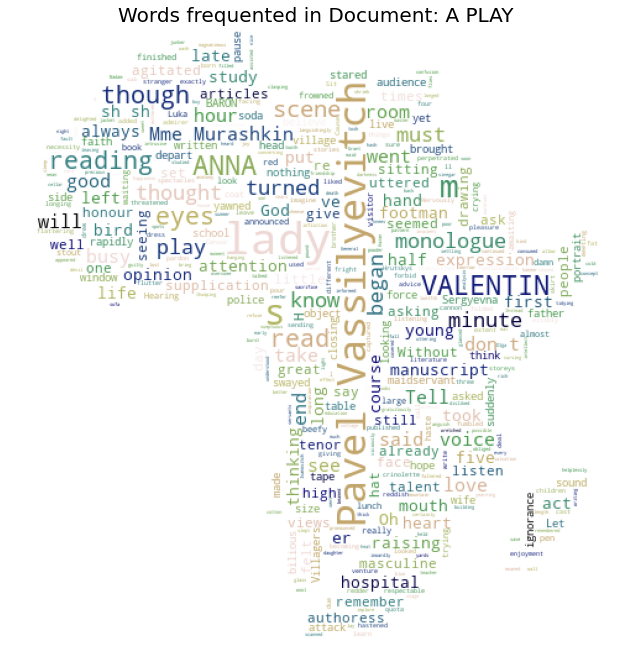

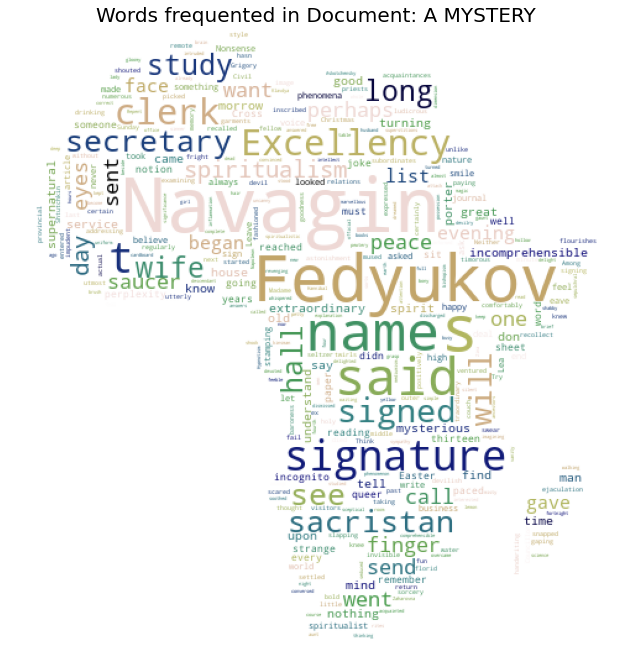

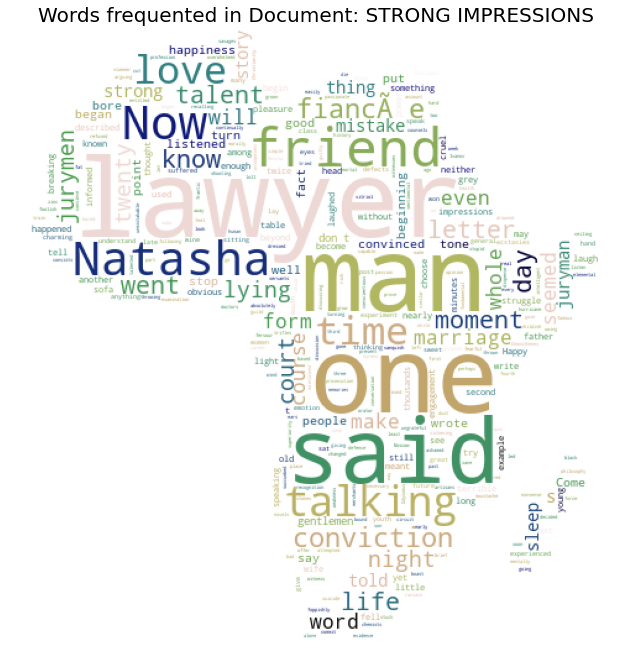

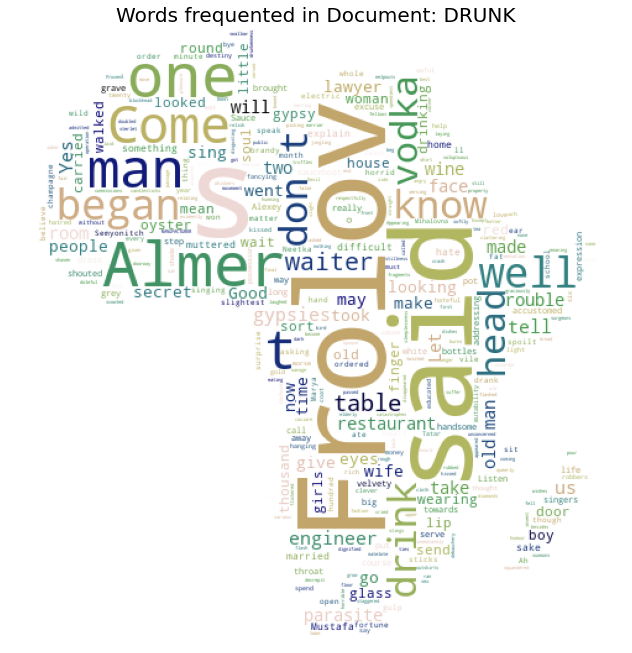

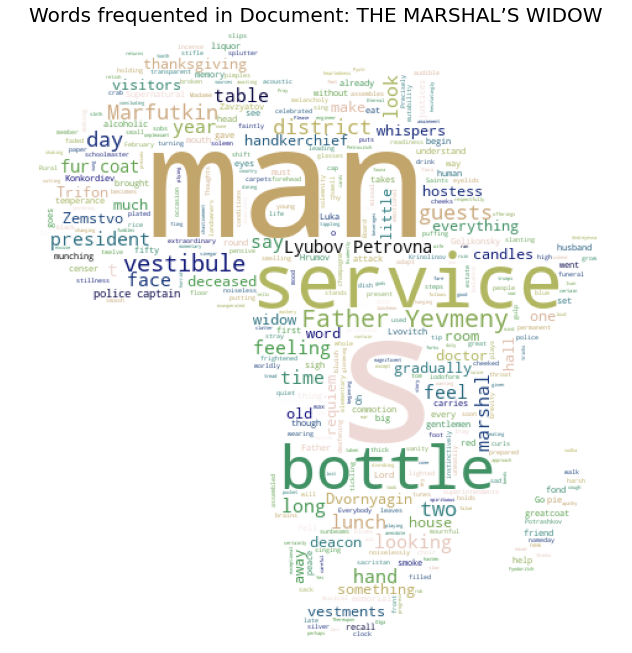

OSError: [Errno 22] Invalid argument: 'A BAD BUSINESS “WHO goes there?”.png'

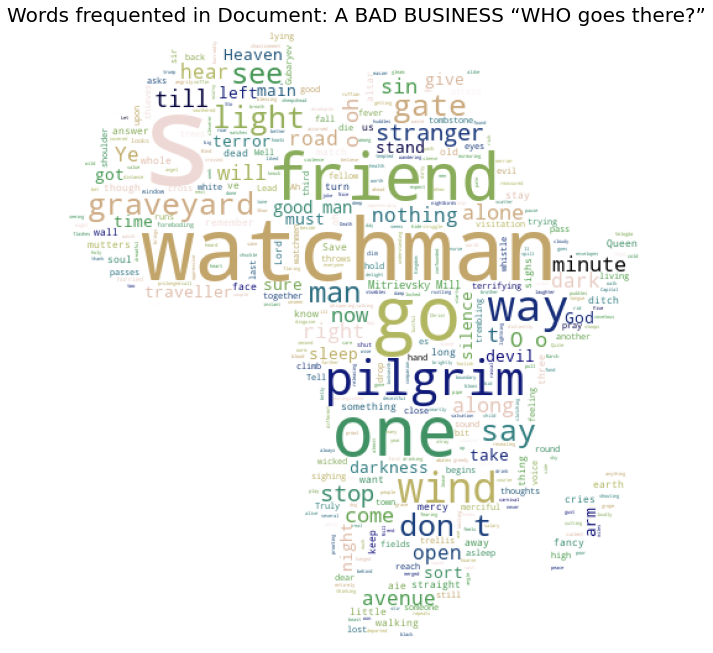

In [43]:
for i in range(50):
    wordcloud(files_obj[i],tiles[i])

In [58]:
a=[[2,2],[3,4]]

In [55]:
a=np.array(a)

In [57]:
a.flatten()

array([2, 2, 3, 4])

In [59]:
a

[[2, 2], [3, 4]]